| **Lab**              | Open Ended 14                                   |
|-----------------------|------------------------------------------------|
| **Group Members**     | CMS ID                                         |
| Muhammad Hamza        | 407251                                         |
| Aqsa Batool           | 413777                                         |
| Ahmed Mohiuddin Shah  | 415216                                         |
| **Section**           | BSCS-12-A                                      |


# Library Imports

In [39]:
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain

from shapely.geometry import Point, LineString

# Loading Dataset

## Loading Airports

In [2]:
airports = pd.read_csv("airports.dat", header=None)
airports.columns = [
    "Airport_ID",
    "Name",
    "City",
    "Country",
    "IATA",
    "ICAO",
    "Latitude",
    "Longitude",
    "Altitude",
    "Timezone",
    "DST",
    "Tz_database_time_zone",
    "Type",
    "Source",
]

airports.head()

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz_database_time_zone,Type,Source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


## Loading Routes

In [3]:
routes = pd.read_csv("routes.dat", header=None)
routes.columns = [
    "Airline",
    "Airline_ID",
    "Source_Airport",
    "Source_Airport_ID",
    "Destination_Airport",
    "Destination_Airport_ID",
    "Codeshare",
    "Stops",
    "Equipment",
]

routes.head()

,Airline,Airline_ID,Source_Airport,Source_Airport_ID,Destination_Airport,Destination_Airport_ID,Codeshare,Stops,Equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


# Preprocessing

## Dataset Shape

In [4]:
# Shape of the data
print("Airports shape: ", airports.shape)
print("Routes shape: ", routes.shape)

Airports shape:  (7698, 14)
Routes shape:  (67663, 9)


## Checking Missing Values

In [5]:
# Check for missing values
print("Airports")
print(airports.isnull().sum())
print("Routes")
print(routes.isnull().sum())

Airports
Airport_ID                0
Name                      0
City                     49
Country                   0
IATA                      0
ICAO                      0
Latitude                  0
Longitude                 0
Altitude                  0
Timezone                  0
DST                       0
Tz_database_time_zone     0
Type                      0
Source                    0
dtype: int64
Routes
Airline                       0
Airline_ID                    0
Source_Airport                0
Source_Airport_ID             0
Destination_Airport           0
Destination_Airport_ID        0
Codeshare                 53066
Stops                         0
Equipment                    18
dtype: int64


- We can see we 49 missing cities in airports so we can just drop these rows as they will have minimal impact.
- We will also drop the unnessaccary data.

- We can drop Equipment, Codeshare and Stops as they are not required and have missing values

In [6]:
airports.dropna(inplace=True)
airports.drop(
    columns=[
        "Altitude",
        "Timezone",
        "DST",
        "Tz_database_time_zone",
        "Type",
        "Source",
    ],
    inplace=True,
)
print("Airports shape: ", airports.shape)

Airports shape:  (7649, 8)


In [7]:
# drop Equipment, Codeshare and Stops columns
routes.drop(["Equipment", "Codeshare", "Stops"], axis=1, inplace=True)
print("Routes shape: ", routes.shape)

Routes shape:  (67663, 6)


## Fixing DataTypes

- IDs in the routes should be integers

In [8]:
# Display column data types
print("Airports data types")
print(airports.dtypes)
print("Routes data types")
print(routes.dtypes)

Airports data types
Airport_ID      int64
Name           object
City           object
Country        object
IATA           object
ICAO           object
Latitude      float64
Longitude     float64
dtype: object
Routes data types
Airline                   object
Airline_ID                object
Source_Airport            object
Source_Airport_ID         object
Destination_Airport       object
Destination_Airport_ID    object
dtype: object


In [9]:
# convert Source_Airport_ID and Destination_Airport_ID and Airline_ID to int
for col in ["Source_Airport_ID", "Destination_Airport_ID", "Airline_ID"]:
    for row in routes.index:
        try:
            routes.at[row, col] = int(routes.at[row, col])
        except ValueError:
            routes.at[row, col] = np.nan

routes.dropna(inplace=True)

# convert Source_Airport_ID and Destination_Airport_ID and Airline_ID to int64
routes["Source_Airport_ID"] = routes["Source_Airport_ID"].astype("int64")
routes["Destination_Airport_ID"] = routes["Destination_Airport_ID"].astype("int64")
routes["Airline_ID"] = routes["Airline_ID"].astype("int64")

# Display column data types
print("Airports data types")
print(airports.dtypes)
print("Routes data types")
print(routes.dtypes)

Airports data types
Airport_ID      int64
Name           object
City           object
Country        object
IATA           object
ICAO           object
Latitude      float64
Longitude     float64
dtype: object
Routes data types
Airline                   object
Airline_ID                 int64
Source_Airport            object
Source_Airport_ID          int64
Destination_Airport       object
Destination_Airport_ID     int64
dtype: object


## Dealing with Missing Airports

- Routes data is only available till 2014 so we have missing airports in routes so we will fix that now.

In [10]:
# Check if airports ids in airports exist in routes data
airports_ids = airports["Airport_ID"].unique()
routes_ids = routes["Source_Airport_ID"].unique()
print("Number of airports in airports data: ", len(airports_ids))
print("Number of airports in routes data: ", len(routes_ids))

# print airports ids that are not in routes data
missing_airports = set(airports_ids) - set(routes_ids)
missing_airports = airports[airports["Airport_ID"].isin(missing_airports)]
print("Airports that are not in routes data")
print(missing_airports)

Number of airports in airports data:  7649
Number of airports in routes data:  3231
Airports that are not in routes data
      Airport_ID                         Name            City  Country IATA  \
12            13         Hornafjörður Airport            Hofn  Iceland  HFN   
13            14              Húsavík Airport         Husavik  Iceland  HZK   
16            17       Patreksfjörður Airport  Patreksfjordur  Iceland  PFJ   
18            19         Siglufjörður Airport    Siglufjordur  Iceland  SIJ   
19            20       Vestmannaeyjar Airport  Vestmannaeyjar  Iceland  VEY   
...          ...                          ...             ...      ...  ...   
7693       14106          Rogachyovo Air Base          Belaya   Russia   \N   
7694       14107        Ulan-Ude East Airport        Ulan Ude   Russia   \N   
7695       14108         Krechevitsy Air Base        Novgorod   Russia   \N   
7696       14109  Desierto de Atacama Airport         Copiapo    Chile  CPO   
7697      

In [11]:
# Remove missing airports from airports data by only including airports that are in routes source and destination data
airports = airports[
    airports["Airport_ID"].isin(routes["Source_Airport_ID"])
    | airports["Airport_ID"].isin(routes["Destination_Airport_ID"])
]

# Check if airports ids in airports exist in routes data
airports_ids = airports["Airport_ID"].unique()
routes_ids = routes["Source_Airport_ID"].unique()

print("Number of airports in airports data: ", len(airports_ids))
print("Number of airports in routes data: ", len(routes_ids))


Number of airports in airports data:  3141
Number of airports in routes data:  3231


In [12]:
# Setting up Distances in the routes data
# Create a new column in the routes data that stores the distance between the source and destination airports
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of the Earth in km
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)
    a = (
        np.sin(delta_phi / 2) * np.sin(delta_phi / 2)
        + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2) * np.sin(delta_lambda / 2)
    )
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c


def get_airport_info(airport_id, column):
    value = airports.loc[airports["Airport_ID"] == airport_id, column]
    if not value.empty:
        return value.values[0]
    else:
        return np.nan


routes["Distance"] = routes.apply(
    lambda row: haversine(
        get_airport_info(row["Source_Airport_ID"], "Latitude"),
        get_airport_info(row["Source_Airport_ID"], "Longitude"),
        get_airport_info(row["Destination_Airport_ID"], "Latitude"),
        get_airport_info(row["Destination_Airport_ID"], "Longitude"),
    ),
    axis=1,
)

# Display the first few rows of the routes data
print(routes.head())

  Airline  Airline_ID Source_Airport  Source_Airport_ID Destination_Airport  \
0      2B         410            AER               2965                 KZN   
1      2B         410            ASF               2966                 KZN   
2      2B         410            ASF               2966                 MRV   
3      2B         410            CEK               2968                 KZN   
4      2B         410            CEK               2968                 OVB   

   Destination_Airport_ID     Distance  
0                    2990  1506.825604  
1                    2990  1040.438320  
2                    2962   448.164909  
3                    2990   770.508500  
4                    4078  1338.631467  


## Visualizing The Data On a Map

### Setting Up data for visualization

In [13]:
# Create GeoDataFrame for airports
geometry = [Point(xy) for xy in zip(airports["Longitude"], airports["Latitude"])]
airports_gdf = gpd.GeoDataFrame(airports, geometry=geometry)

# Set the coordinate reference system (CRS) to WGS84
airports_gdf.set_crs("EPSG:4326", inplace=True)

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,geometry
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,POINT (145.392 -6.08169)
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,POINT (145.789 -5.20708)
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,POINT (144.29601 -5.82679)
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,POINT (146.72598 -6.5698)
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,POINT (147.22 -9.44338)
...,...,...,...,...,...,...,...,...,...
6924,11290,Kongolo Airport,Kongolo,Congo (Kinshasa),KOO,FZRQ,-5.394440,26.990000,POINT (26.99 -5.39444)
6947,11436,Tarko-Sale Airport,Tarko-Sale,Russia,TQL,USDS,64.930801,77.818100,POINT (77.8181 64.9308)
6950,11473,Jinchuan Airport,Jinchuan,China,JIC,ZLJC,38.542222,102.348333,POINT (102.34833 38.54222)
6952,11498,Alashankou Bole (Bortala) airport,Bole,China,BPL,ZWAX,44.895000,82.300000,POINT (82.3 44.895)


In [14]:
# Merge route data with airport data to get coordinates
routes_with_coords = routes.merge(
    airports[["IATA", "Latitude", "Longitude"]],
    left_on="Source_Airport",
    right_on="IATA",
).merge(
    airports[["IATA", "Latitude", "Longitude"]],
    left_on="Destination_Airport",
    right_on="IATA",
    suffixes=("_source", "_dest"),
)

# Create LineString geometry for routes
routes_with_coords["geometry"] = routes_with_coords.apply(
    lambda row: LineString(
        [
            (row["Longitude_source"], row["Latitude_source"]),
            (row["Longitude_dest"], row["Latitude_dest"]),
        ]
    ),
    axis=1,
)

# Create GeoDataFrame for routes
routes_gdf = gpd.GeoDataFrame(routes_with_coords, geometry="geometry", crs="EPSG:4326")

In [15]:
# Load a basemap
world = gpd.read_file("./ne_110m_admin_0_countries")

### Airports

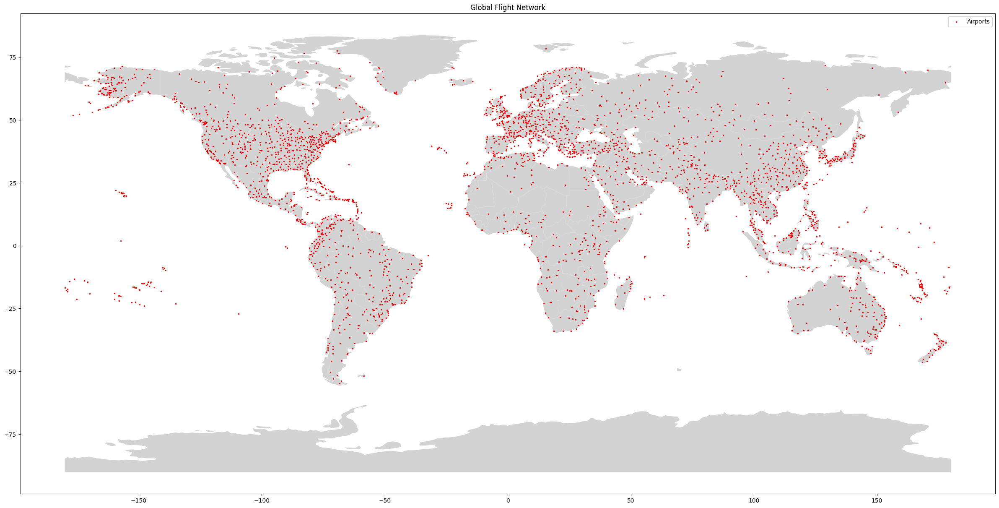

In [16]:
# Plot the data
fig, ax = plt.subplots(figsize=(30, 20))
world.plot(ax=ax, color="lightgrey")

# Plot airports
airports_gdf.plot(ax=ax, color="red", markersize=2, label="Airports")

# Add legend and title
plt.legend()
plt.title("Global Flight Network")
plt.show()

### Routes

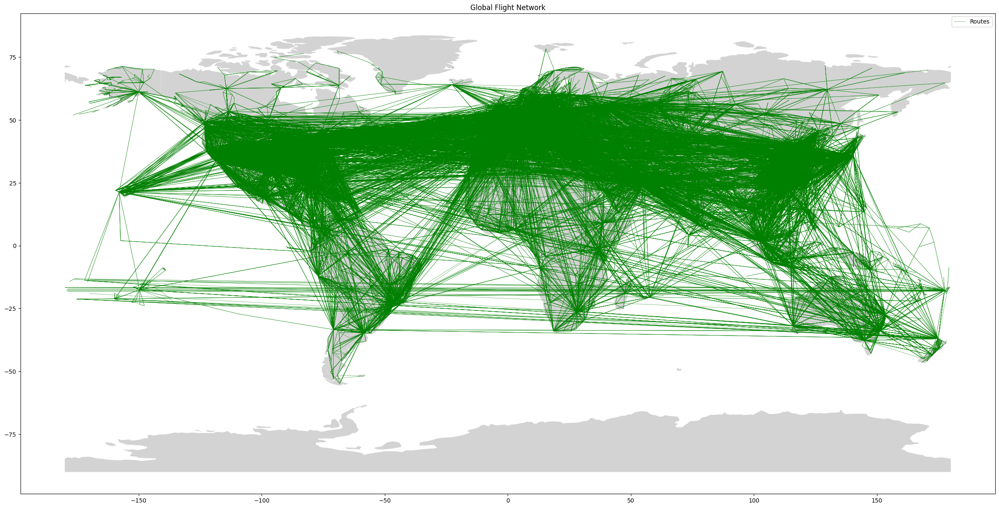

In [17]:
# Plot the data
fig, ax = plt.subplots(figsize=(30, 20))
world.plot(ax=ax, color="lightgrey")

# Plot routes
routes_gdf.plot(ax=ax, color="green", linewidth=0.5, alpha=0.7, label="Routes")

# Add legend and title
plt.legend()
plt.title("Global Flight Network")
plt.show()

## Creating the Graph

In [18]:
airports.head()

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001


In [19]:
routes.head()

,Airline,Airline_ID,Source_Airport,Source_Airport_ID,Destination_Airport,Destination_Airport_ID,Distance
0,2B,410,AER,2965,KZN,2990,1506.825604
1,2B,410,ASF,2966,KZN,2990,1040.438320
2,2B,410,ASF,2966,MRV,2962,448.164909
3,2B,410,CEK,2968,KZN,2990,770.508500
4,2B,410,CEK,2968,OVB,4078,1338.631467


# Visualizing graph

Number of nodes:  3246
Number of edges:  18890


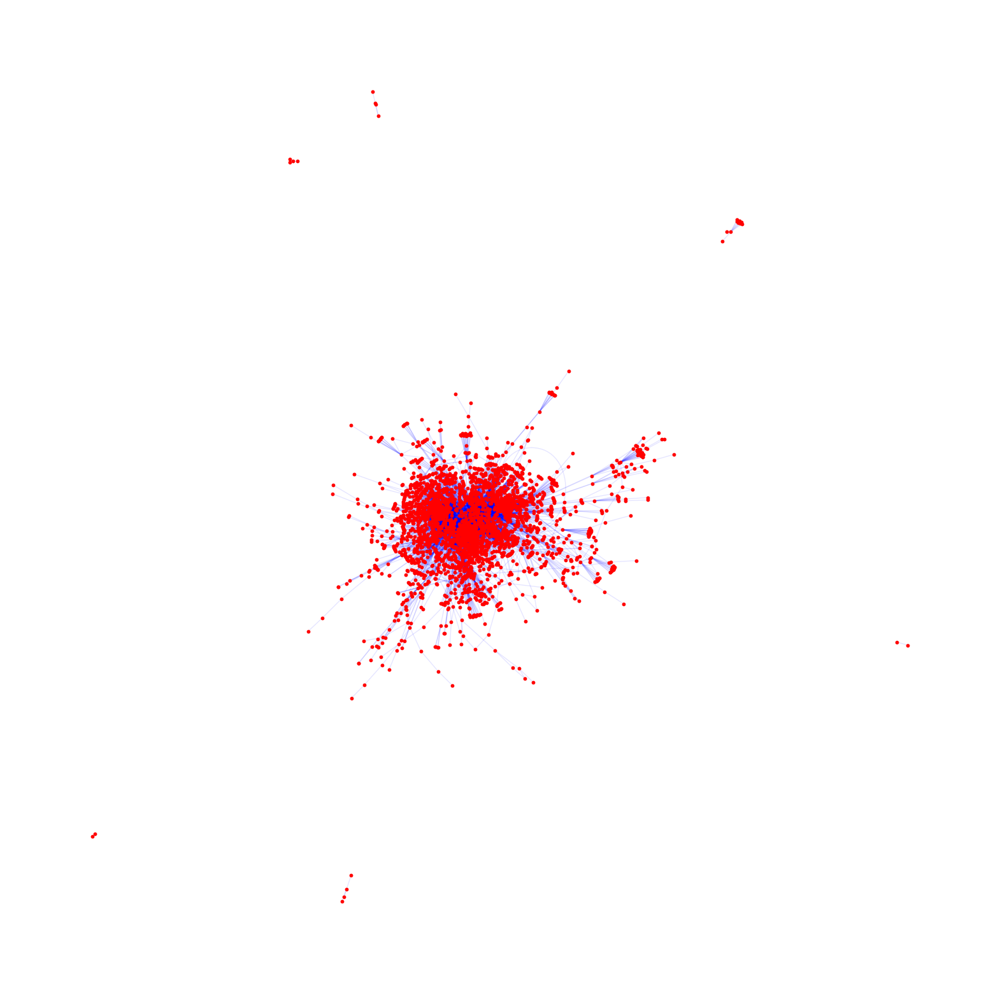

In [20]:
# Create a graph from the routes and airports data for 1000 airports
# Node attributes are the airport Name, Latitude and Longitude, and the Country, City
# Edge attributes are the Airline, Source Airport and Destination Airport, and the Distance and edge weight is the distance

G = nx.Graph()

for i, airport in airports.iterrows():
    G.add_node(
        airport["Airport_ID"],
        Name=airport["Name"],
        Latitude=airport["Latitude"],
        Longitude=airport["Longitude"],
        Country=airport["Country"],
        City=airport["City"],
    )

for i, route in routes.iterrows():

    G.add_edge(
        route["Source_Airport_ID"],
        route["Destination_Airport_ID"],
        Airline=route["Airline"],
        Distance=route["Distance"],
    )

# Display the number of nodes and edges in the graph
print("Number of nodes: ", G.number_of_nodes())
print("Number of edges: ", G.number_of_edges())


# plot the graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=10, node_color="red")
nx.draw_networkx_edges(G, pos, edge_color="blue", alpha=0.1)
plt.axis("off")
plt.show()



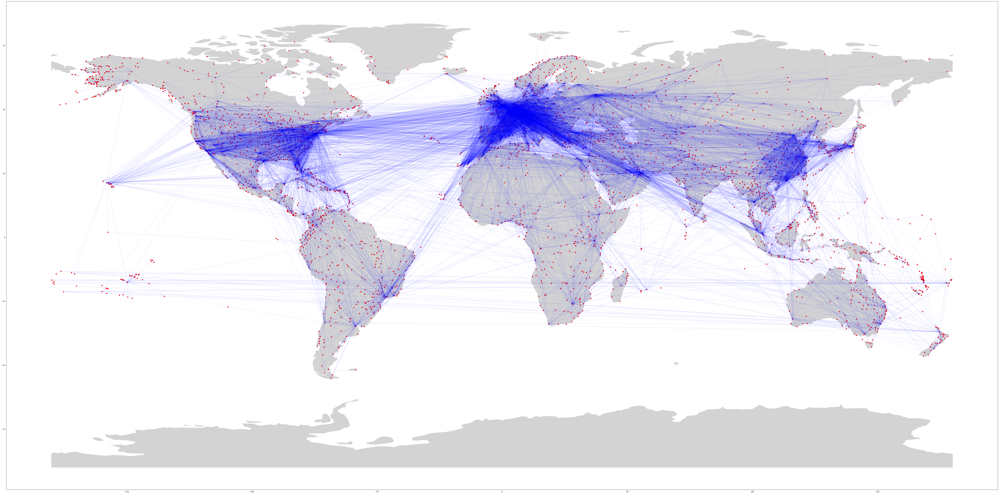

In [35]:
# Plot this graph on the world map
fig, ax = plt.subplots(figsize=(100, 100))
world.plot(ax=ax, color="lightgrey")

# Plot airports
airports_gdf.plot(ax=ax, color="red", markersize=30, label="Airports")

# Plot routes using the graph
for u, v, data in G.edges(data=True):
    source = airports[airports["Airport_ID"] == u]
    dest = airports[airports["Airport_ID"] == v]
    if not source.empty and not dest.empty:
        x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
        y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
        ax.plot(x, y, color="blue", alpha=0.1)

# Graph Analysis

## Centraility Measures


### Degree Centrality

In [22]:
# Degree centrality
degree_centrality = nx.degree_centrality(G)
print("Degree Centrality Top 20")
print(sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20])

# show the top 20 airports with the highest degree centrality
top_20_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
top_20_airports = [airport[0] for airport in top_20_degree_centrality]
print("Top 20 airports with the highest degree centrality")
top_20_airports = airports[airports["Airport_ID"].isin(top_20_airports)]
top_20_airports[["Name", "City", "Country"]]



Degree Centrality Top 20
[(580, 0.07642526964560863), (340, 0.07519260400616333), (1382, 0.07395993836671803), (1701, 0.07211093990755008), (3682, 0.06687211093990755), (3364, 0.0637904468412943), (3830, 0.06348228043143297), (346, 0.059167950693374424), (3670, 0.05793528505392912), (4029, 0.05793528505392912), (2188, 0.05731895223420647), (507, 0.0526964560862866), (3751, 0.052388289676425275), (3550, 0.052080123266563944), (502, 0.05084745762711865), (1218, 0.05023112480739599), (1555, 0.04992295839753467), (3797, 0.04992295839753467), (1229, 0.048998459167950696), (3406, 0.04745762711864407)]
Top 20 airports with the highest degree centrality


,Name,City,Country
336,Frankfurt am Main Airport,Frankfurt,Germany
342,Munich Airport,Munich,Germany
497,London Gatwick Airport,London,United Kingdom
502,London Heathrow Airport,London,United Kingdom
574,Amsterdam Airport Schiphol,Amsterdam,Netherlands
1186,Barcelona International Airport,Barcelona,Spain
1196,Adolfo Suárez Madrid–Barajas Airport,Madrid,Spain
1346,Charles de Gaulle International Airport,Paris,France
1514,Leonardo da Vinci–Fiumicino Airport,Rome,Italy
1655,Atatürk International Airport,Istanbul,Turkey


C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\2857037063.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_20_airports["geometry"] = top_20_airports.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)


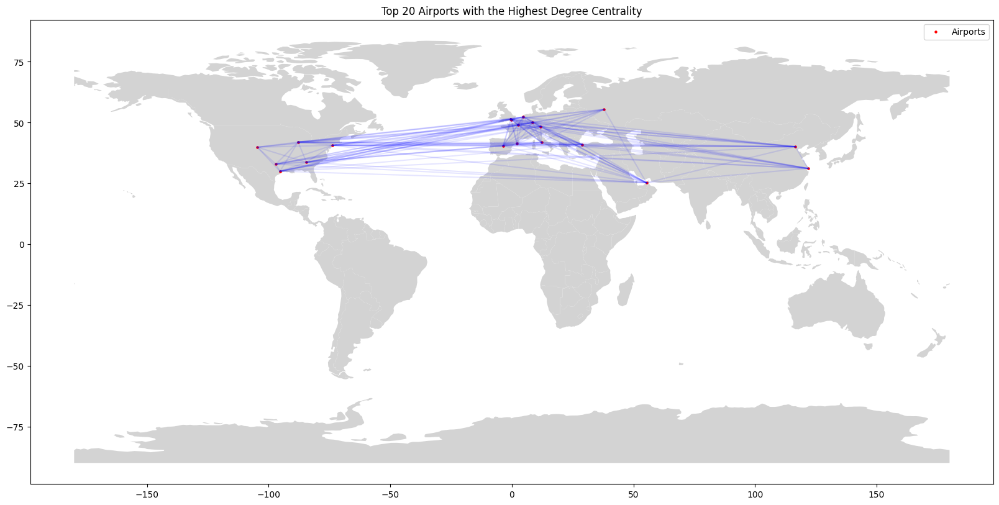

In [23]:
# Plot the top 20 airports along with the routes on the world map
fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")

# Create geometry for top 20 airports
top_20_airports["geometry"] = top_20_airports.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)

# Plot airports
top_20_airports_gdf = gpd.GeoDataFrame(top_20_airports, geometry="geometry")
top_20_airports_gdf.plot(ax=ax, color="red", markersize=5, label="Airports")

# Plot routes of only the top 20 airports
for u, v, data in G.edges(data=True):
    source = airports[airports["Airport_ID"] == u]
    dest = airports[airports["Airport_ID"] == v]
    if not source.empty and not dest.empty:
        if u in top_20_airports["Airport_ID"].values and v in top_20_airports["Airport_ID"].values:
            x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
            y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
            ax.plot(x, y, color="blue", alpha=0.1)

# Add legend and title
plt.legend()
plt.title("Top 20 Airports with the Highest Degree Centrality")
plt.show()

### Betweenness centrality


In [24]:
betweenness_centrality = nx.betweenness_centrality(G)
print("Betweenness Centrality Top 20")
print(sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:20])

# show the top 20 airports with the highest betweenness centrality
top_20_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
top_20_airports = [airport[0] for airport in top_20_betweenness_centrality]
print("Top 20 airports with the highest betweenness centrality")
top_20_airports = airports[airports["Airport_ID"].isin(top_20_airports)]
top_20_airports[["Name", "City", "Country"]]


Betweenness Centrality Top 20
[(3774, 0.07361786567949483), (3484, 0.06602610747051542), (1382, 0.06332384083059737), (2188, 0.0579723432759357), (340, 0.05221775391161535), (580, 0.050944929462778656), (3364, 0.05050375362818598), (3830, 0.04877657557784666), (1701, 0.04260567876898757), (3577, 0.04226468548511359), (2564, 0.041460458191203794), (2279, 0.035978762105080504), (507, 0.035784265357423586), (3361, 0.03457476242522401), (3320, 0.03262237447713837), (3316, 0.0321696091504822), (3682, 0.030493490204815402), (193, 0.03043903290014769), (3670, 0.030037603921343758), (4029, 0.029941852690789954)]
Top 20 airports with the highest betweenness centrality


,Name,City,Country
191,Lester B. Pearson International Airport,Toronto,Canada
336,Frankfurt am Main Airport,Frankfurt,Germany
502,London Heathrow Airport,London,United Kingdom
574,Amsterdam Airport Schiphol,Amsterdam,Netherlands
1346,Charles de Gaulle International Airport,Paris,France
1655,Atatürk International Airport,Istanbul,Turkey
2100,Dubai International Airport,Dubai,United Arab Emirates
2181,Narita International Airport,Tokyo,Japan
2436,Guarulhos - Governador André Franco Montoro In...,Sao Paulo,Brazil
3124,Singapore Changi Airport,Singapore,Singapore


C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\3602539459.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_20_airports["geometry"] = top_20_airports.apply(


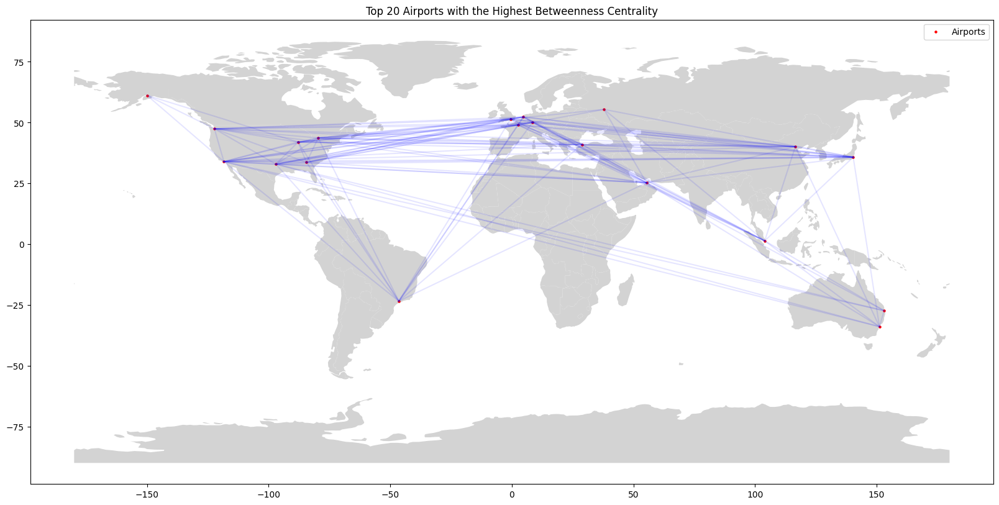

In [25]:
# Plot the top 20 airports along with the routes on the world map

fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")

# Create geometry for top 20 airports
top_20_airports["geometry"] = top_20_airports.apply(
    lambda row: Point(row["Longitude"], row["Latitude"]), axis=1
)

# Plot airports
top_20_airports_gdf = gpd.GeoDataFrame(top_20_airports, geometry="geometry")

top_20_airports_gdf.plot(ax=ax, color="red", markersize=5, label="Airports")

# Plot routes of only the top 20 airports
for u, v, data in G.edges(data=True):
    source = airports[airports["Airport_ID"] == u]
    dest = airports[airports["Airport_ID"] == v]
    if not source.empty and not dest.empty:
        if (
            u in top_20_airports["Airport_ID"].values
            and v in top_20_airports["Airport_ID"].values
        ):
            x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
            y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
            ax.plot(x, y, color="blue", alpha=0.1)

# Add legend and title
plt.legend()
plt.title("Top 20 Airports with the Highest Betweenness Centrality")
plt.show()

### Closeness centrality

In [26]:
closeness_centrality = nx.closeness_centrality(G)
print("Closeness Centrality Top 20")
print(sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:20])

# show the top 20 airports with the highest closeness centrality
top_20_closeness_centrality = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
top_20_airports = [airport[0] for airport in top_20_closeness_centrality]
print("Top 20 airports with the highest closeness centrality")
top_20_airports = airports[airports["Airport_ID"].isin(top_20_airports)]
top_20_airports[["Name", "City", "Country"]]


Closeness Centrality Top 20
[(340, 0.40797346626971587), (1382, 0.40558977778395355), (507, 0.40257290979488985), (2188, 0.39925085277482697), (580, 0.3989515642794935), (3484, 0.3937371541915001), (3797, 0.3918047019009897), (1701, 0.38649338180743964), (193, 0.3854204369937316), (3364, 0.3846775473428582), (346, 0.3841222567656762), (3830, 0.38379907698233967), (1555, 0.3816887784476531), (2279, 0.3814152317836916), (11051, 0.3804155730870939), (3930, 0.38014384767774595), (3494, 0.37933099554443644), (1229, 0.3782525847539761), (1678, 0.37749241287304247), (3077, 0.3766908482355864)]
Top 20 airports with the highest closeness centrality


,Name,City,Country
191,Lester B. Pearson International Airport,Toronto,Canada
336,Frankfurt am Main Airport,Frankfurt,Germany
342,Munich Airport,Munich,Germany
502,London Heathrow Airport,London,United Kingdom
574,Amsterdam Airport Schiphol,Amsterdam,Netherlands
1196,Adolfo Suárez Madrid–Barajas Airport,Madrid,Spain
1346,Charles de Gaulle International Airport,Paris,France
1514,Leonardo da Vinci–Fiumicino Airport,Rome,Italy
1633,Zürich Airport,Zurich,Switzerland
1655,Atatürk International Airport,Istanbul,Turkey


C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\1497536346.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_20_airports["geometry"] = top_20_airports.apply(


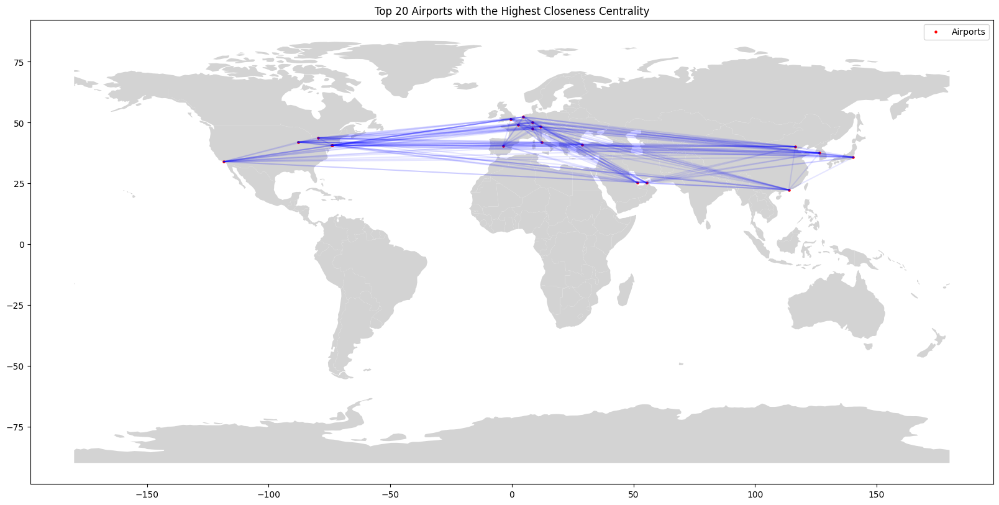

In [27]:
# Plot the top 20 airports along with the routes on the world map
fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")

# Create geometry for top 20 airports
top_20_airports["geometry"] = top_20_airports.apply(
    lambda row: Point(row["Longitude"], row["Latitude"]), axis=1
)

# Plot airports
top_20_airports_gdf = gpd.GeoDataFrame(top_20_airports, geometry="geometry")
top_20_airports_gdf.plot(ax=ax, color="red", markersize=5, label="Airports")

# Plot routes of only the top 20 airports
for u, v, data in G.edges(data=True):
    source = airports[airports["Airport_ID"] == u]
    dest = airports[airports["Airport_ID"] == v]
    if not source.empty and not dest.empty:
        if (
            u in top_20_airports["Airport_ID"].values
            and v in top_20_airports["Airport_ID"].values
        ):
            x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
            y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
            ax.plot(x, y, color="blue", alpha=0.1)

# Add legend and title
plt.legend()
plt.title("Top 20 Airports with the Highest Closeness Centrality")
plt.show()

### Eigenvector centrality

In [28]:
eigenvector_centrality = nx.eigenvector_centrality(G)
print("Eigenvector Centrality Top 20")
print(sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:20])

# show the top 20 airports with the highest eigenvector centrality
top_20_eigenvector_centrality = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
top_20_airports = [airport[0] for airport in top_20_eigenvector_centrality]
print("Top 20 airports with the highest eigenvector centrality")
top_20_airports = airports[airports["Airport_ID"].isin(top_20_airports)]
top_20_airports[["Name", "City", "Country"]]

Eigenvector Centrality Top 20
[(580, 0.16792585666626145), (340, 0.16642489501276814), (1382, 0.15947827824488484), (346, 0.14857478657557832), (1555, 0.1363697226609043), (507, 0.13595543998872472), (1701, 0.12924939974870828), (1218, 0.1281882478410757), (1678, 0.12604445661100186), (1229, 0.12302006228516146), (302, 0.12298934773976031), (599, 0.11607826918322638), (345, 0.11513788717538893), (478, 0.11482750161093339), (502, 0.11457297318345723), (1613, 0.11405699424341814), (609, 0.10943640623095165), (3797, 0.10657530403680163), (1524, 0.1054867414069122), (2188, 0.10350062409680948)]
Top 20 airports with the highest eigenvector centrality


,Name,City,Country
299,Brussels Airport,Brussels,Belgium
336,Frankfurt am Main Airport,Frankfurt,Germany
341,Düsseldorf Airport,Duesseldorf,Germany
342,Munich Airport,Munich,Germany
473,Manchester Airport,Manchester,United Kingdom
497,London Gatwick Airport,London,United Kingdom
502,London Heathrow Airport,London,United Kingdom
574,Amsterdam Airport Schiphol,Amsterdam,Netherlands
592,Dublin Airport,Dublin,Ireland
601,Copenhagen Kastrup Airport,Copenhagen,Denmark


C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\1533950448.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_20_airports["geometry"] = top_20_airports.apply(


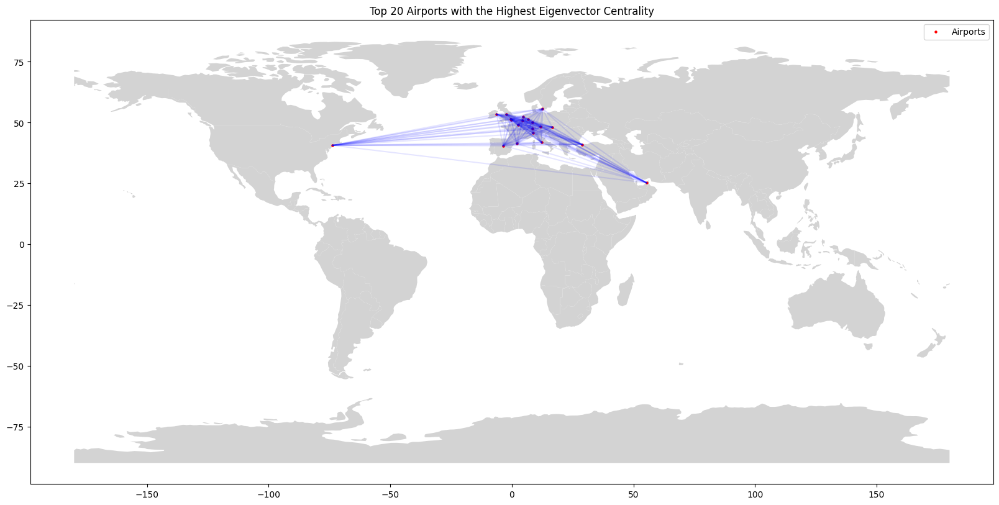

In [29]:
# Plot the
# top 20 airports along with the routes on the world map
fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")

# Create geometry for top 20 airports
top_20_airports["geometry"] = top_20_airports.apply(
    lambda row: Point(row["Longitude"], row["Latitude"]), axis=1
)

# Plot airports
top_20_airports_gdf = gpd.GeoDataFrame(top_20_airports, geometry="geometry")
top_20_airports_gdf.plot(ax=ax, color="red", markersize=5, label="Airports")

# Plot routes of only the top 20 airports
for u, v, data in G.edges(data=True):
    source = airports[airports["Airport_ID"] == u]
    dest = airports[airports["Airport_ID"] == v]
    if not source.empty and not dest.empty:
        if (
            u in top_20_airports["Airport_ID"].values
            and v in top_20_airports["Airport_ID"].values
        ):
            x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
            y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
            ax.plot(x, y, color="blue", alpha=0.1)

# Add legend and title
plt.legend()
plt.title("Top 20 Airports with the Highest Eigenvector Centrality")
plt.show()

## Community Detection

### Louvain community detection

Number of communities:  29
Community Detection using Louvain Algorithm
{1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1, 8: 1, 9: 1, 10: 1, 11: 1, 12: 1, 15: 1, 16: 2, 18: 1, 21: 3, 27: 3, 28: 3, 29: 4, 30: 3, 31: 3, 32: 4, 33: 3, 34: 3, 37: 4, 40: 4, 41: 4, 45: 3, 49: 3, 50: 4, 54: 4, 55: 4, 56: 3, 58: 4, 60: 4, 61: 3, 63: 3, 65: 3, 67: 3, 68: 4, 69: 4, 70: 3, 72: 4, 73: 3, 75: 4, 78: 3, 79: 3, 87: 3, 90: 3, 94: 6, 100: 3, 106: 3, 108: 3, 109: 4, 111: 3, 112: 3, 113: 3, 115: 3, 116: 3, 117: 3, 119: 3, 120: 3, 121: 3, 122: 3, 125: 3, 126: 3, 127: 3, 128: 4, 132: 4, 133: 3, 135: 3, 136: 4, 140: 4, 141: 4, 143: 3, 144: 3, 146: 3, 147: 4, 148: 4, 149: 3, 152: 4, 153: 3, 154: 4, 155: 4, 156: 3, 160: 3, 161: 3, 162: 3, 164: 3, 166: 3, 167: 3, 168: 3, 169: 3, 170: 4, 172: 3, 173: 3, 174: 3, 175: 3, 176: 3, 177: 3, 178: 3, 179: 3, 181: 3, 182: 3, 183: 4, 184: 3, 187: 4, 188: 3, 189: 3, 190: 3, 192: 3, 193: 3, 196: 4, 198: 3, 199: 3, 200: 3, 202: 3, 209: 2, 210: 2, 211: 2, 216: 2, 220: 2, 221: 2, 222

C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\3189709148.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  community_airports["geometry"] = community_airports.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\3189709148.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  community_airports["geometry"] = community_airports.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
C:\Users\Ahmed M

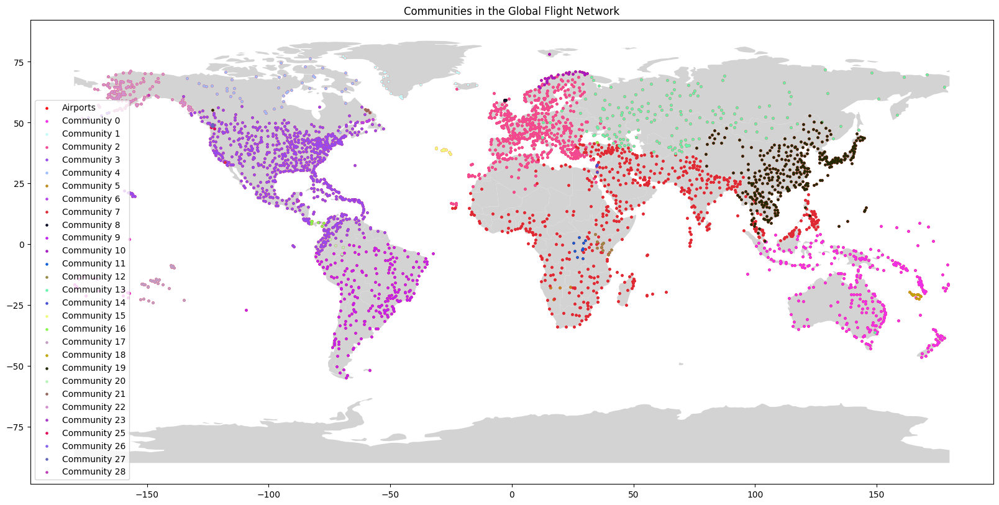

In [38]:
# Community Detection Apply algorithms like Louvain or Girvan-Newman to find
# communities in the network.)
# Route Analysis (Evaluate shortest paths or create alternative routes between major
# hubs.)
partition = community_louvain.best_partition(G)
print("Number of communities: ", len(set(partition.values())))
print("Community Detection using Louvain Algorithm")

# Plot the communities on the world map
fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")

# Plot communities on the world map
for community_id in set(partition.values()):
    community_airports = [airport for airport in partition.keys() if partition[airport] == community_id]
    community_airports = airports[airports["Airport_ID"].isin(community_airports)]
    community_airports["geometry"] = community_airports.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
    community_airports_gdf = gpd.GeoDataFrame(community_airports, geometry="geometry")
    community_airports_gdf.plot(ax=ax, color=np.random.rand(3,), markersize=5, label=f"Community {community_id}")

# Add legend and title
plt.legend()
plt.title("Communities in the Global Flight Network")
plt.show()

# Route Analysis

Shortest Path between LAX and PKC:  [3484, 2279, 2927, 2932]


C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\1091540864.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dest["geometry"] = dest.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\1091540864.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dest["geometry"] = dest.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
C:\Users\Ahmed Mohiuddin Shah\AppData\Local\Temp\ipykernel_3288\10915408

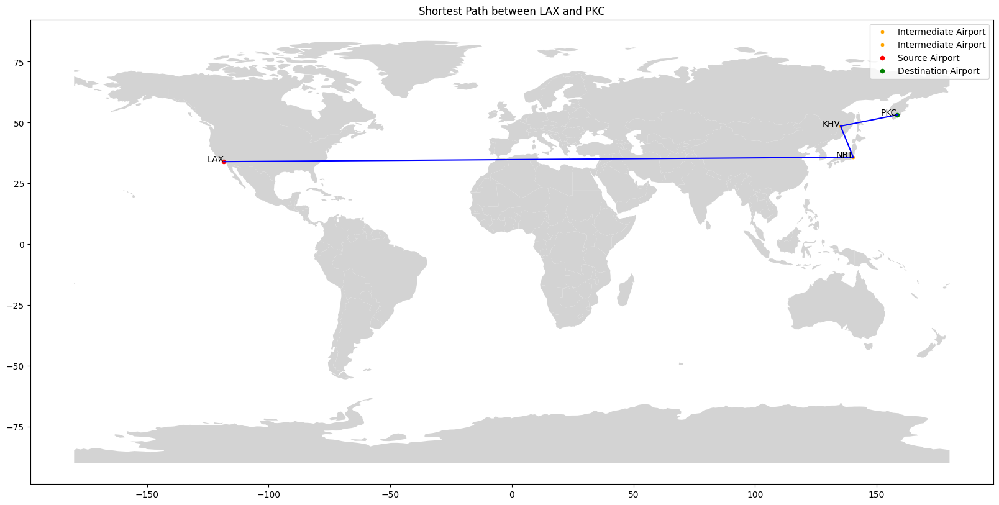

In [79]:
# Route Analysis (Evaluate shortest paths or create alternative routes between major hubs.)

# Shortest Path Analysis
# Find the shortest path between two airports
source_airport = "LAX"
dest_airport = "PKC"

source_airport_id = airports[airports["IATA"] == source_airport]["Airport_ID"].values[0]
dest_airport_id = airports[airports["IATA"] == dest_airport]["Airport_ID"].values[0]

shortest_path = nx.shortest_path(G, source_airport_id, dest_airport_id, weight="Distance")
print(f"Shortest Path between {source_airport} and {dest_airport}: ", shortest_path)
shortest_path_airports = airports[airports["Airport_ID"].isin(shortest_path)]
shortest_path_airports[["Name", "City", "Country"]]

# Plot the shortest path on the world map
fig, ax = plt.subplots(figsize=(20, 20))
world.plot(ax=ax, color="lightgrey")


# Plot routes of the shortest path
for i in range(len(shortest_path) - 1):
    source = airports[airports["Airport_ID"] == shortest_path[i]]
    dest = airports[airports["Airport_ID"] == shortest_path[i + 1]]
    if not dest["IATA"].isin([source_airport, dest_airport]).any():
        # plot the dot of dest on the map
        dest["geometry"] = dest.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
        dest_gdf = gpd.GeoDataFrame(dest, geometry="geometry")
        dest_gdf.plot(ax=ax, color="orange", markersize=10, label="Intermediate Airport")

        # print the intermediate airports on the points
        for i, row in dest.iterrows():
            ax.text(row["Longitude"], row["Latitude"], row["IATA"], fontsize=10, ha="right")

    if not source.empty and not dest.empty:
        x = [source["Longitude"].values[0], dest["Longitude"].values[0]]
        y = [source["Latitude"].values[0], dest["Latitude"].values[0]]
        ax.plot(x, y, color="blue")

# label the source and destination airports
source_airport = airports[airports["IATA"] == source_airport]
dest_airport = airports[airports["IATA"] == dest_airport]



# Create geometry for source and destination airports
source_airport["geometry"] = source_airport.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)
dest_airport["geometry"] = dest_airport.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)

source_airport_gdf = gpd.GeoDataFrame(source_airport, geometry="geometry")
dest_airport_gdf = gpd.GeoDataFrame(dest_airport, geometry="geometry")

source_airport_gdf.plot(ax=ax, color="red", markersize=20, label="Source Airport")
dest_airport_gdf.plot(ax=ax, color="green", markersize=20, label="Destination Airport")

# print the source and destination airports on the points
for i, row in source_airport.iterrows():
    ax.text(row["Longitude"], row["Latitude"], row["IATA"], fontsize=10, ha="right")
for i, row in dest_airport.iterrows():
    ax.text(row["Longitude"], row["Latitude"], row["IATA"], fontsize=10, ha="right")


# Add legend and title
plt.legend()
plt.title(f"Shortest Path between {source_airport['IATA'].values[0]} and {dest_airport['IATA'].values[0]}")
plt.show()